# This cat does not exist
__Суммарное количество баллов: 10__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[ITMO][ML][MS][HW06] <ФИО>`, где вместо `<ФИО>` указаны фамилия и имя__

Цель этого задания - создать котов, которых не существует. В ходе данного задания вы обучите DCGAN и VAE, которые являются одними из первых генеративных моделей. Для этого задания вам наверняка потребуется GPU с CUDA, поэтому рекомендуется использовать Google Colab.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/notebooks/6/cat_136.zip" -d "/content/"

In [ ]:
import torch
from torch import nn
from torch.optim import Adam
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import os 
import cv2
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import random
import numpy as np

%matplotlib inline

In [ ]:
def random_noise(batch_size, channels, side_size):
    return torch.randn(batch_size, channels, side_size, side_size).cuda()

def imagewide_average(x):
    return x.mean(dim=(-1, -2))

In [ ]:
def visualise(imgs, rows=2):
    imgs = (imgs.transpose(1, 3) + 1) / 2
    imgs = torch.cat([imgs[i::rows] for i in range(rows)], dim=1)
    cols = len(imgs)
    imgs = (torch.cat(list(imgs), dim=1)).cpu().numpy()[:, :, ::-1]
    plt.figure(figsize=(cols*1.5, rows*1.5))
    plt.imshow(imgs)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:
class CatDataset(Dataset):
    def __init__(self, path_to_dataset="cat_136/", size=64):
        self.photo_names = os.listdir(path_to_dataset)
        self.path_base = path_to_dataset
        self.size = size
    
    def __getitem__(self, index):
        path = self.path_base + "/" + self.photo_names[index]
        img = cv2.imread(path) # 136 x 136
        crop_rate = 8
        x_crop = random.randint(0, crop_rate)
        y_crop = random.randint(0, crop_rate)
        img = img[x_crop:136 - crop_rate + x_crop, y_crop:136 - crop_rate + y_crop]
        img = cv2.resize(img, (self.size, self.size), interpolation=cv2.INTER_CUBIC)
        return 2 * torch.tensor(img).float().transpose(0, 2) / 255. - 1
    
    def __len__(self):
        return len(self.photo_names)

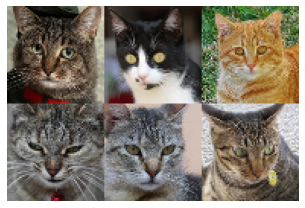

In [ ]:
dataset = CatDataset()
visualise(torch.cat([dataset[i].unsqueeze(0) for i in [1, 2, 3, 4, 5, 6]], dim=0))

### Задание 1 (2 балла)
Для начала реализуем генератор для нашего DCGAN. Предлагается использовать следующую архитектуру:

![](imgs/DCGAN.png)

Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ConvTranspose2D`, `nn.ReLU`, а также функция `F.interpolate`.

#### Методы
* `__init__` - принимает на вход `start_size`, `latent_channels`, `start_channels` и `upsamplings`. Первые два аргумента отвечают за размер случайного шума, из которого в последствии будет сгенерирована картинка. `start_channels` отвечает за то, сколько каналов должно быть в картинке перед тем, как к ней будут применены upsampling блоки. `upsamplings` - это количество upsampling блоков, которые должны быть применены к картинке. В каждом таком локе количество каналов уменьшается в два раза.


* `forward` - принимает на вход `batch_size`, генерирует `batch_size` картинок из случайного шума.

In [ ]:
class Generator(nn.Module):
    def __init__(self, start_size=2, latent_channels=32, start_channels=1024, upsamplings=6):
        super().__init__()
        self.start_size = start_size
        self.latent_channels = latent_channels
        # self.start_channels = start_channels
        # self.upsamplings = upsamplings
        
        self.layer1 = nn.Conv2d(self.latent_channels, start_channels, kernel_size=1, stride=1, padding=0)
        self.upsampling_layers = nn.Sequential(
        *[self.upsampling_layer(start_channels // (2 ** i)) for i in range(upsamplings)])
        self.layer2 = nn.Sequential(
            nn.Conv2d(start_channels // (2 ** upsamplings), 3, kernel_size=1, stride=1, padding=0),
            nn.Tanh())


    def upsampling_layer(self, c):
        return nn.Sequential(
                nn.ConvTranspose2d(c, c//2, kernel_size=4, stride=2, padding=1),
                nn.BatchNorm2d(c // 2, affine=False),
                nn.ReLU())


    def forward(self, batch_size: int):
        input = torch.randn(batch_size, self.latent_channels, self.start_size, self.start_size).cuda()
        out = self.layer1(input)
        out = self.upsampling_layers(out)
        out = self.layer2(out)
        return out

### Задание 2 (2 балла)
Для начала реализуем дискриминатор для нашего DCGAN. Предлагается использовать следующую архитектуру:

![](imgs/Disc_DCGAN.png)

Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ReLU` и `nn.Sigmoid`.

#### Методы
* `__init__` - принимает на вход `start_channels` и `downsamplings`. `start_channels` определяет количество каналов, которые должны быть в изображении перед применением downsampling блоков.


* `forward` - принимает на вход `x` - тензор с картинками. Возвращает вектор с размерностью `batch_size`.

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, image_size=128*128, downsamplings=6, start_channels=8):
        super().__init__()
        self.image_size = image_size
        # self.downsamplings = downsamplings
        # self.start_channels = start_channels

        self.layer1 = nn.Conv2d(3, start_channels, kernel_size=1, stride=1, padding=0)         
        self.downsampling_layers = nn.Sequential(
            *[self.downsampling_layer(start_channels * (2 ** i)) for i in range(downsamplings)])
        # self.layer2 = self.last_layer(start_channels * (2 ** downsamplings)) 
        self.layer2 = nn.Sequential(
            nn.Flatten(),
            nn.Linear(start_channels * (2 ** downsamplings) * self.image_size // 4 ** (downsamplings), 1),
            nn.Sigmoid())


    def downsampling_layer(self, c):
        return nn.Sequential(
                nn.Conv2d(c, c * 2,  kernel_size=3, stride=2, padding=1),
                nn.BatchNorm2d(c * 2, affine=False),
                nn.ReLU())

    def forward(self, x):
        out = self.layer1(x)
        out = self.downsampling_layers(out)
        out = self.layer2(out)
        return out

In [ ]:
def train_gan():
    generator = Generator()
    discriminator = Discriminator()
    epochs = 40    # 120
    visualise_every = 5    # 10
    batch_size = 8
    generator.cuda()
    discriminator.cuda()

    gen_optim = Adam(generator.parameters(), lr=1e-4, betas=(0.5, 0.999))
    disc_optim = Adam(discriminator.parameters(), lr=1e-4, betas=(0.5, 0.999))

    dataset = CatDataset(size=128)

    for ep in range(epochs):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        gen_loss_avg = 0
        disc_loss_avg = 0

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            # Positive update
            batch = batch.cuda()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Negative update
            batch = generator(batch_size).detach()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.zeros_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Generator update
            batch = generator(batch_size)
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            gen_optim.zero_grad()
            loss.backward()
            gen_optim.step()
            gen_loss_avg += loss.item()
            
        if (ep + 1) % visualise_every == 0:
            with torch.no_grad():
                visualise(generator(6), rows=2)

        print(f"Epoch {ep+1} | Discriminator loss: {disc_loss_avg / total_batches} | Generator loss: {gen_loss_avg / total_batches}")

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 1 | Discriminator loss: 0.13734816803100883 | Generator loss: 5.025716496550518


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 2 | Discriminator loss: 0.002451111126614005 | Generator loss: 6.836959413860155


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 3 | Discriminator loss: 0.3216883219509455 | Generator loss: 4.461297660510732


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 4 | Discriminator loss: 0.5545529360830154 | Generator loss: 3.6550985116581


  0%|          | 0/645 [00:00<?, ?it/s]

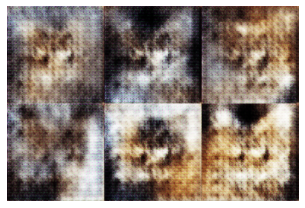

Epoch 5 | Discriminator loss: 0.8264378961826448 | Generator loss: 2.7137980479631363


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 6 | Discriminator loss: 0.9660076670441198 | Generator loss: 2.1586329817586805


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 7 | Discriminator loss: 0.8731601596650846 | Generator loss: 2.1738735743746256


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 8 | Discriminator loss: 0.8821568047246022 | Generator loss: 2.1621555097354865


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 9 | Discriminator loss: 0.8896719098224172 | Generator loss: 2.124376399916892


  0%|          | 0/645 [00:00<?, ?it/s]

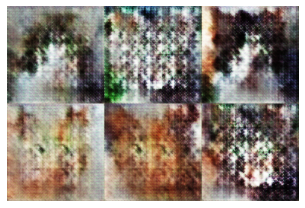

Epoch 10 | Discriminator loss: 0.8748938750080846 | Generator loss: 2.132476444662728


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 11 | Discriminator loss: 0.8562020697574542 | Generator loss: 2.0846678081506527


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 12 | Discriminator loss: 0.8283998950237049 | Generator loss: 2.1689238917568456


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 13 | Discriminator loss: 0.8159586578985005 | Generator loss: 2.1461993105107955


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 14 | Discriminator loss: 0.80885939959253 | Generator loss: 2.2038880010939534


  0%|          | 0/645 [00:00<?, ?it/s]

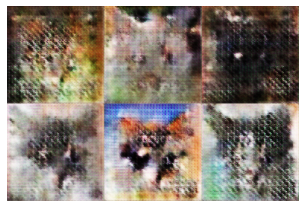

Epoch 15 | Discriminator loss: 0.7450875812452373 | Generator loss: 2.358404307909634


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 16 | Discriminator loss: 0.7052945122292688 | Generator loss: 2.3750108440655358


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 17 | Discriminator loss: 0.6793439245501878 | Generator loss: 2.502929078403467


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 18 | Discriminator loss: 0.6817245238510493 | Generator loss: 2.547011478832975


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 19 | Discriminator loss: 0.664731183473631 | Generator loss: 2.4885498636998005


  0%|          | 0/645 [00:00<?, ?it/s]

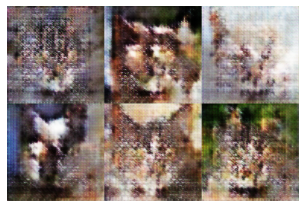

Epoch 20 | Discriminator loss: 0.6324475042954715 | Generator loss: 2.6458320356674077


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 21 | Discriminator loss: 0.5850743069159813 | Generator loss: 2.704235687759352


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 22 | Discriminator loss: 0.5418889399670153 | Generator loss: 2.954010945947274


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 23 | Discriminator loss: 0.546630623838604 | Generator loss: 2.9261408345484585


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 24 | Discriminator loss: 0.541421476495416 | Generator loss: 2.8476741488861


  0%|          | 0/645 [00:00<?, ?it/s]

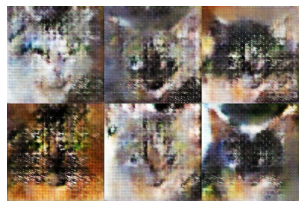

Epoch 25 | Discriminator loss: 0.46825878493443907 | Generator loss: 3.0748393480081737


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 26 | Discriminator loss: 0.47217939622531735 | Generator loss: 3.138602110262243


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 27 | Discriminator loss: 0.4425708372973814 | Generator loss: 3.242423661006904


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 28 | Discriminator loss: 0.4494412307134361 | Generator loss: 3.35770566891069


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 29 | Discriminator loss: 0.4043737616466274 | Generator loss: 3.447812313850252


  0%|          | 0/645 [00:00<?, ?it/s]

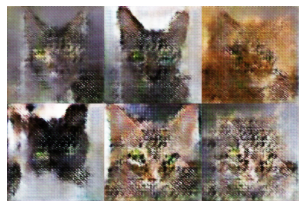

Epoch 30 | Discriminator loss: 0.3741634498535249 | Generator loss: 3.660247234083851


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 31 | Discriminator loss: 0.4077330319612217 | Generator loss: 3.5364467652503007


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 32 | Discriminator loss: 0.39211558902653165 | Generator loss: 3.567489301936227


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 33 | Discriminator loss: 0.39951132911531584 | Generator loss: 3.473265033978853


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 34 | Discriminator loss: 0.4106103220112221 | Generator loss: 3.4477344457962498


  0%|          | 0/645 [00:00<?, ?it/s]

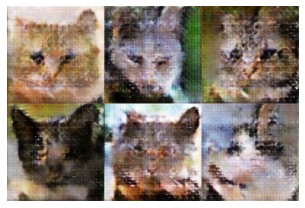

Epoch 35 | Discriminator loss: 0.3812076891000113 | Generator loss: 3.6888038381841612


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 36 | Discriminator loss: 0.3622537926896161 | Generator loss: 3.843733178440088


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 37 | Discriminator loss: 0.3742556136281361 | Generator loss: 3.8558728533872166


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 38 | Discriminator loss: 0.33096607500557407 | Generator loss: 3.925894855538973


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 39 | Discriminator loss: 0.35163475713873016 | Generator loss: 3.8151274852871153


  0%|          | 0/645 [00:00<?, ?it/s]

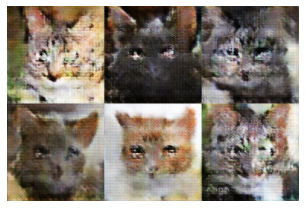

Epoch 40 | Discriminator loss: 0.34730851170842814 | Generator loss: 3.956384068597918


In [ ]:
train_gan()

### Задание 3 (5 баллов)
Теперь посмотрим на другую модель: Variational Autoencoder. В отличии от GAN, в котором генератор пытается себя обмануть дискриминатор, а дискриминатор старается не быть обманутым, VAE решает задачу реконструкции элемента множества X с применением регуляризации в латентном пространстве. 

Полностью архитектура выглядит так:
![](imgs/VAE.png)



В данном задании вам необходимо реализовать полную архитектуру VAE.

#### Методы
* `__init__` - принимает на вход `img_size`, `downsamplings`, `latent_size`, `linear_hidden_size`, `down_channels` и `up_channels`. `img_size` - размер стороны входного изображения. `downsamplings` - количество downsampling (и upsampling) блоков. `latent_size` - размер латентного пространства, в котором в который будет закодирована картинка. `linear_hidden_size` количество нейронов на скрытом слое полносвязной сети в конце encoder'а. Для полносвязной сети decoder'а это число стоит умножить на 2. `down_channels` - количество каналов, в которое будет преобразовано трехцветное изображение перед применением `downsampling` блоков. `up_channels` - количество каналов, которое должно получиться после применения всех upsampling блоков.

* `forward` - принимает на вход `x`. Считает распределение $N(\mu, \sigma^2)$ и вектор $z \sim N(\mu, \sigma^2)$. Возвращает $x'$ - восстановленную из вектора $z$ картинку и $D_{KL}(N(\mu, \sigma^2), N(0, 1)) = 0.5 \cdot (\sigma^2 + \mu^2 - \log \sigma^2 - 1)$.

* `encode` - принимает на вход `x`. Возвращает вектор из распределения $N(\mu, \sigma^2)$.

* `decode` - принимает на вход `z`. Возвращает восстановленную по вектору картинку.


#### Если хочется улучшить качество
https://arxiv.org/pdf/1906.00446.pdf

In [ ]:
class VAE(nn.Module):
    def __init__(self, img_size=128, downsamplings=5, latent_size=512, linear_hidden_size=1024, down_channels=8, up_channels=16):
        super().__init__()
        self.latent_size = latent_size
        
        layer1 = nn.Conv2d(3, down_channels, kernel_size=1, stride=1, padding=0)
        downsampling_layers = nn.Sequential(
            *[self.downsampling_layer(down_channels * (2 ** i)) for i in range(downsamplings)])
        layer2 = nn.Sequential(nn.Conv2d(down_channels * (2 ** downsamplings), 2 * latent_size, kernel_size=1, stride=1, padding=0),
                               nn.Flatten(),
                               nn.Linear(img_size ** 2 // (4 ** downsamplings) * 2 * latent_size, linear_hidden_size))
        self.encoder = nn.Sequential(layer1, downsampling_layers, layer2)

        self.layer2_3 = nn.Linear(latent_size, 16 * latent_size)    # увеличиваем размерность
        layer3 = nn.Conv2d(latent_size, up_channels * (2 ** downsamplings), kernel_size=1, stride=1, padding=0)
        upsampling_layers = nn.Sequential(
        *[self.upsampling_layer(up_channels * (2 ** i)) for i in range(downsamplings, 0, -1)])
        layer4 = nn.Sequential(
            nn.Conv2d(up_channels, 3, kernel_size=1, stride=1, padding=0),
            nn.Tanh())
        self.decoder = nn.Sequential(layer3, upsampling_layers, layer4)


    def upsampling_layer(self, c):
        return nn.Sequential(
                nn.ConvTranspose2d(c, c//2, kernel_size=4, stride=2, padding=1),
                nn.BatchNorm2d(c // 2, affine=False),
                nn.ReLU())


    def downsampling_layer(self, c):
        return nn.Sequential(
                nn.Conv2d(c, c * 2,  kernel_size=3, stride=2, padding=1),
                nn.BatchNorm2d(c * 2, affine=False),
                nn.ReLU())


    def forward(self, x):
        out = self.encoder(x)
        mu, sigma = torch.split(out, self.latent_size, dim=1)
        sigma = torch.exp(sigma)
        kld = 0.5 * (sigma ** 2 + mu ** 2 - torch.log(sigma ** 2) - 1)
        z = self.encode(x)
        x_pred = self.decode(z)
        return x_pred, kld
    
    def encode(self, x):
        out = self.encoder(x)
        mu, sigma = torch.split(out, self.latent_size, dim=1)
        sigma = torch.exp(sigma)
        return mu.cuda() + sigma.cuda() * torch.randn(sigma.size()).cuda()
    
    def decode(self, z):
        out = self.layer2_3(z)
        x_pred = self.decoder(torch.reshape(out, [-1, self.latent_size, 4, 4]))
        return x_pred

In [ ]:
def train_vae():
    vae = VAE()
    vae.cuda()

    epochs = 200
    batch_size = 8
    vae_optim = Adam(vae.parameters(), lr=1e-4)

    dataset = CatDataset(size=128)

    test_imgs_1 = torch.cat([dataset[i].unsqueeze(0) for i in (0, 34, 76, 1509)])
    test_imgs_2 = torch.cat([dataset[i].unsqueeze(0) for i in (734, 123, 512, 3634)])

    for ep in range(epochs):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        rec_loss_avg = 0
        kld_loss_avg = 0

        if (ep + 1) % 10 == 0:
            with torch.no_grad():
                z_1 = vae.encode(test_imgs_1.cuda())
                z_2 = vae.encode(test_imgs_2.cuda())
                x_int = []
                for i in range(9):
                    z = (i * z_1 + (8 - i) * z_2) / 8
                    x_int.append(vae.decode(z))
                x_int = torch.cat(x_int)
                visualise(x_int, rows=len(test_imgs_1))
                z_rand = torch.randn_like(z_1)
                x_int = vae.decode(z_rand)
                visualise(x_int, rows=len(test_imgs_1)//2)

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            x = batch.cuda()
            x_rec, kld = vae(x)
            img_elems = float(np.prod(list(batch.size())))
            kld_loss = kld.sum() / batch_size
            rec_loss = ((x_rec - x)**2).sum() / batch_size
            loss = rec_loss + 0.1 * kld_loss # https://openreview.net/forum?id=Sy2fzU9gl
            vae_optim.zero_grad()
            loss.backward()
            vae_optim.step()
            kld_loss_avg += kld_loss.item()
            rec_loss_avg += rec_loss.item()

        print(f"Epoch {ep+1} | Reconstruction loss: {rec_loss_avg / total_batches} | KLD loss: {kld_loss_avg / total_batches}")


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 1 | Reconstruction loss: 6281.422739727897 | KLD loss: 805.9510005808766


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 2 | Reconstruction loss: 4100.320023625533 | KLD loss: 979.7180375756684


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 3 | Reconstruction loss: 3695.635136385142 | KLD loss: 1038.1836864400354


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 4 | Reconstruction loss: 3487.3877533148534 | KLD loss: 1083.0955899635458


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 5 | Reconstruction loss: 3321.3652078379755 | KLD loss: 1103.5884230714407


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 6 | Reconstruction loss: 3031.290504597729 | KLD loss: 1134.02632359096


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 7 | Reconstruction loss: 2834.8954115210113 | KLD loss: 1145.1022540738124


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 8 | Reconstruction loss: 2720.8139957404283 | KLD loss: 1157.1120858518234


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 9 | Reconstruction loss: 2635.431517038286 | KLD loss: 1165.4704782237177


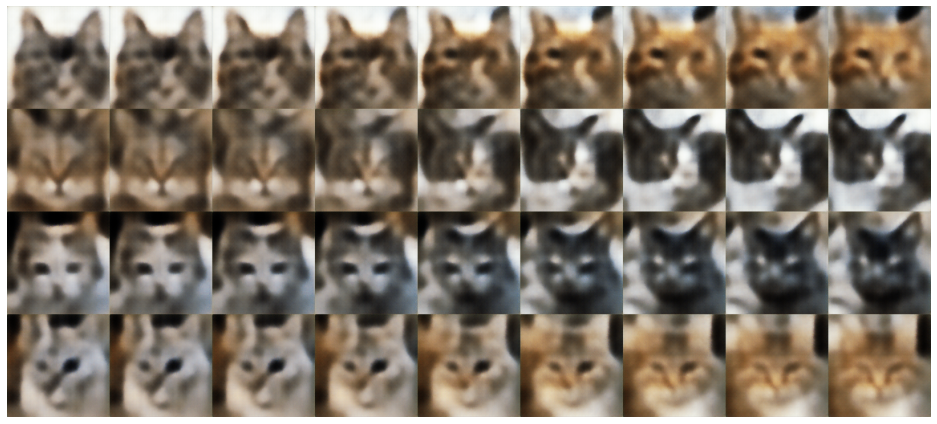

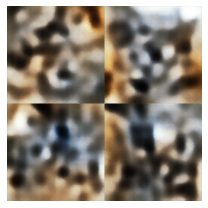

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 10 | Reconstruction loss: 2576.42938384062 | KLD loss: 1172.9229759074146


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 11 | Reconstruction loss: 2507.7795645198466 | KLD loss: 1174.8203354355712


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 12 | Reconstruction loss: 2464.0837220375583 | KLD loss: 1175.9430129720558


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 13 | Reconstruction loss: 2434.3055668232605 | KLD loss: 1179.1916855521824


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 14 | Reconstruction loss: 2391.0562571649966 | KLD loss: 1176.9472867598445


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 15 | Reconstruction loss: 2358.862726815739 | KLD loss: 1185.1074044363838


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 16 | Reconstruction loss: 2328.868057724852 | KLD loss: 1183.4878820573322


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 17 | Reconstruction loss: 2316.23315998338 | KLD loss: 1184.5696546661188


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 18 | Reconstruction loss: 2274.433027563628 | KLD loss: 1182.0044746161989


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 19 | Reconstruction loss: 2271.4445374293355 | KLD loss: 1184.0873305042337


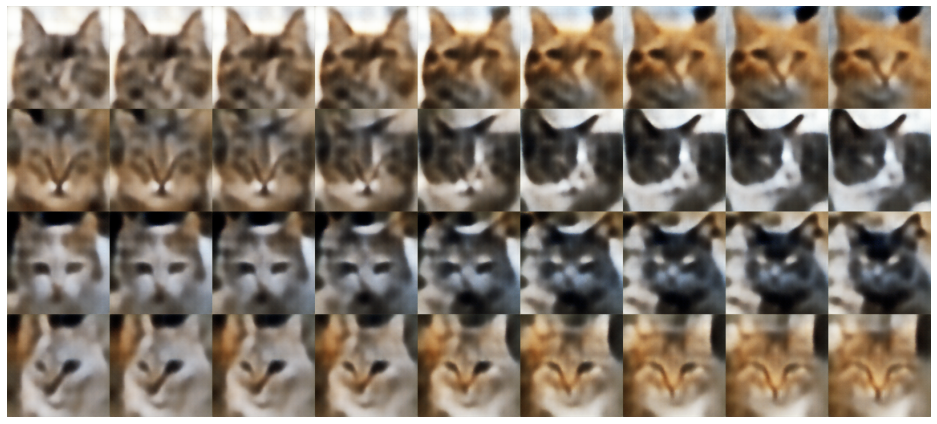

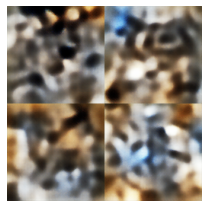

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 20 | Reconstruction loss: 2233.105825483429 | KLD loss: 1179.3425165022381


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 21 | Reconstruction loss: 2235.7185966539087 | KLD loss: 1186.1549885435875


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 22 | Reconstruction loss: 2200.432483744177 | KLD loss: 1180.9506019923997


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 23 | Reconstruction loss: 2193.7891042010383 | KLD loss: 1188.8082165451524


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 24 | Reconstruction loss: 2176.4737776288334 | KLD loss: 1185.8135401565837


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 25 | Reconstruction loss: 2141.730140069997 | KLD loss: 1184.472426325638


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 26 | Reconstruction loss: 2133.191740426958 | KLD loss: 1183.1778810868352


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 27 | Reconstruction loss: 2123.6781599151423 | KLD loss: 1182.5714081000096


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 28 | Reconstruction loss: 2113.3011055703487 | KLD loss: 1184.4846839667848


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 29 | Reconstruction loss: 2098.7066121545636 | KLD loss: 1185.043614357895


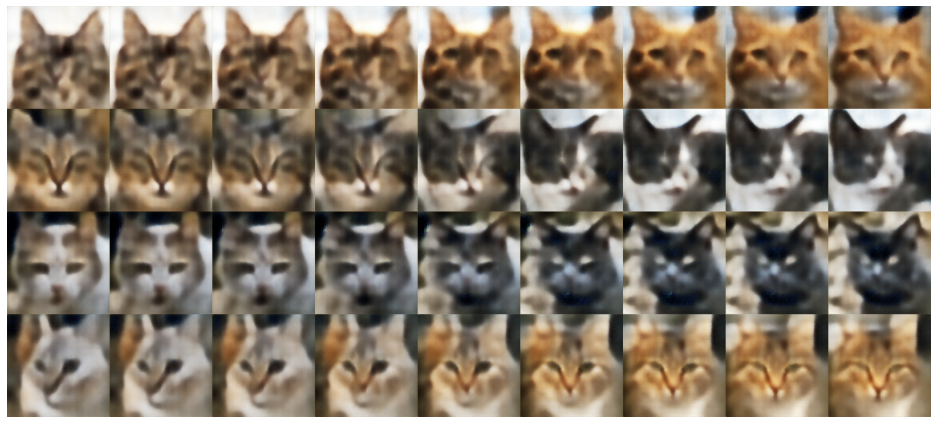

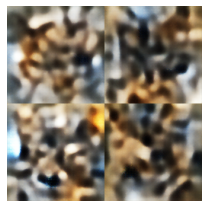

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 30 | Reconstruction loss: 2077.412975240198 | KLD loss: 1181.8243784460221


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 31 | Reconstruction loss: 2087.377887607361 | KLD loss: 1191.8084671304832


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 32 | Reconstruction loss: 2057.2119407890746 | KLD loss: 1186.5092952562416


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 33 | Reconstruction loss: 2045.6314841323758 | KLD loss: 1187.3322399447422


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 34 | Reconstruction loss: 2031.1625980353504 | KLD loss: 1188.8544298254926


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 35 | Reconstruction loss: 2011.6041981951792 | KLD loss: 1184.4534846714564


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 36 | Reconstruction loss: 2010.179799334603 | KLD loss: 1190.6168161712078


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 37 | Reconstruction loss: 1991.853214050672 | KLD loss: 1188.1646201566139


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 38 | Reconstruction loss: 1981.9078302798064 | KLD loss: 1184.742692082565


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 39 | Reconstruction loss: 1970.5614491338315 | KLD loss: 1191.3732962282547


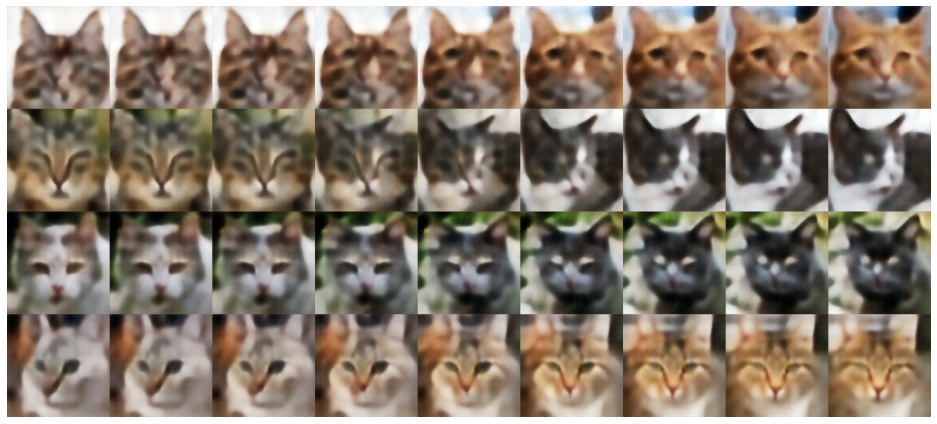

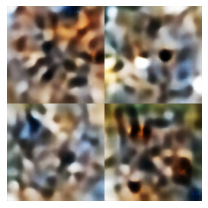

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 40 | Reconstruction loss: 1950.5806755871506 | KLD loss: 1189.0885896860443


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 41 | Reconstruction loss: 1947.1184330341978 | KLD loss: 1187.849206959979


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 42 | Reconstruction loss: 1943.325991802334 | KLD loss: 1190.4007979683254


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 43 | Reconstruction loss: 1921.4544675838874 | KLD loss: 1188.8470037235236


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 44 | Reconstruction loss: 1911.8221757782171 | KLD loss: 1188.9117704592877


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 45 | Reconstruction loss: 1907.2678258670783 | KLD loss: 1191.1107166361364


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 46 | Reconstruction loss: 1907.8223149080454 | KLD loss: 1192.7970546935655


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 47 | Reconstruction loss: 1884.570440446368 | KLD loss: 1188.6804506290032


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 48 | Reconstruction loss: 1886.8024200060354 | KLD loss: 1190.7360929880083


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 49 | Reconstruction loss: 1869.7878399013732 | KLD loss: 1190.8042689732142


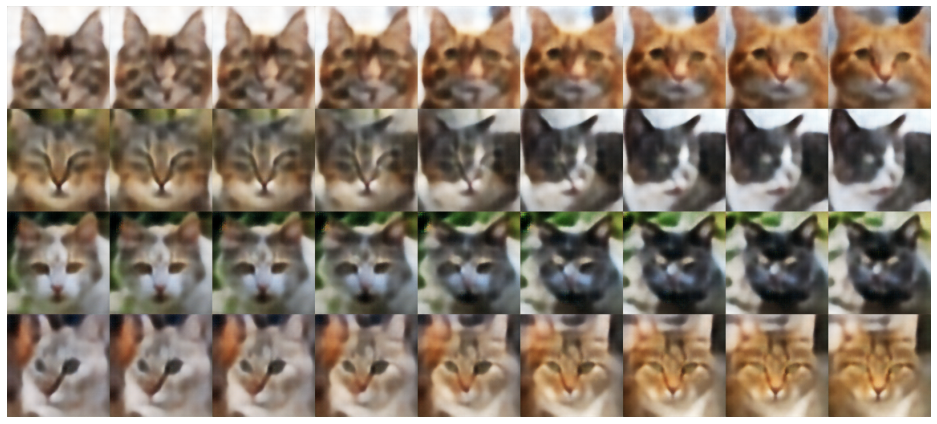

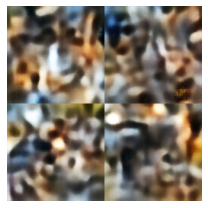

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 50 | Reconstruction loss: 1867.231637516377 | KLD loss: 1191.4475501398122


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 51 | Reconstruction loss: 1849.6029718055488 | KLD loss: 1188.3821687876068


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 52 | Reconstruction loss: 1853.6647094347463 | KLD loss: 1190.6195523279794


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 53 | Reconstruction loss: 1845.333956321574 | KLD loss: 1191.5533342065278


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 54 | Reconstruction loss: 1831.801336632012 | KLD loss: 1187.9739119251321


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 55 | Reconstruction loss: 1824.0752728385214 | KLD loss: 1189.8713265176145


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 56 | Reconstruction loss: 1826.3169405919425 | KLD loss: 1193.7611265004791


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 57 | Reconstruction loss: 1808.1268367411928 | KLD loss: 1191.3915166440217


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 58 | Reconstruction loss: 1806.37829855214 | KLD loss: 1191.7652396444948


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 59 | Reconstruction loss: 1804.4037248125728 | KLD loss: 1193.3443806334312


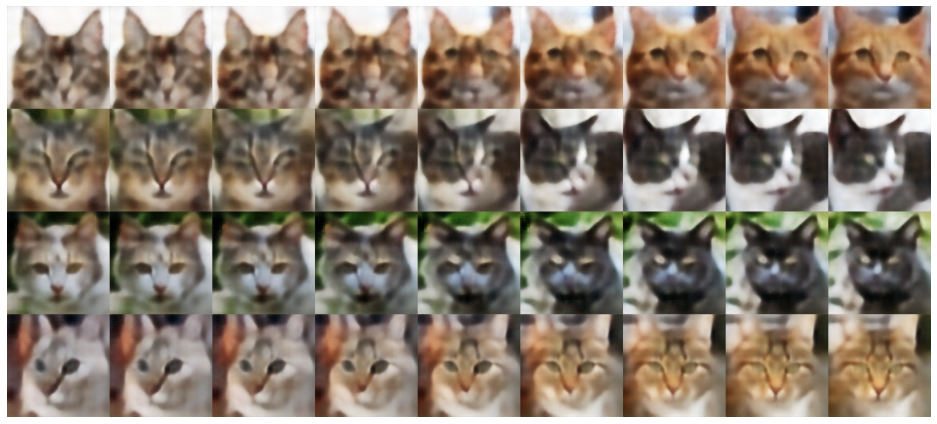

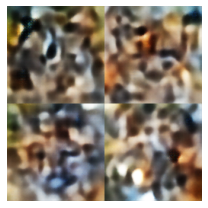

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 60 | Reconstruction loss: 1786.4536214319075 | KLD loss: 1192.4085597636538


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 61 | Reconstruction loss: 1781.559435731876 | KLD loss: 1191.8505548512715


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 62 | Reconstruction loss: 1782.5241358028436 | KLD loss: 1192.4674114914415


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 63 | Reconstruction loss: 1770.6988038246675 | KLD loss: 1190.7318299098044


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 64 | Reconstruction loss: 1775.0776090444244 | KLD loss: 1195.476878101041


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 65 | Reconstruction loss: 1767.4530332577156 | KLD loss: 1195.7962020021048


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 66 | Reconstruction loss: 1753.8762421222948 | KLD loss: 1190.888624297906


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 67 | Reconstruction loss: 1742.9539374120486 | KLD loss: 1189.7942601553402


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 68 | Reconstruction loss: 1743.5282060137447 | KLD loss: 1189.4024747291708


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 69 | Reconstruction loss: 1742.7465956788626 | KLD loss: 1190.5735193098553


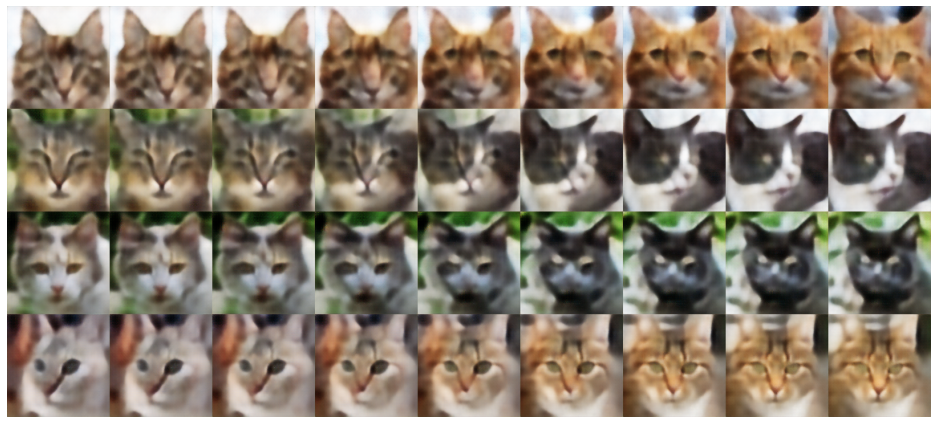

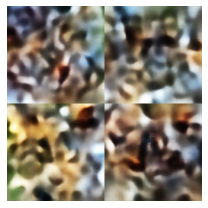

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 70 | Reconstruction loss: 1738.0012112256163 | KLD loss: 1194.6433575553183


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 71 | Reconstruction loss: 1729.0369494894276 | KLD loss: 1190.479984828404


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 72 | Reconstruction loss: 1730.716324895065 | KLD loss: 1193.7172815547967


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 73 | Reconstruction loss: 1719.3523757650246 | KLD loss: 1193.6609299938132


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 74 | Reconstruction loss: 1725.8708935850154 | KLD loss: 1199.533343202579


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 75 | Reconstruction loss: 1706.556961722996 | KLD loss: 1191.0872878554444


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 76 | Reconstruction loss: 1706.2241642164147 | KLD loss: 1191.0495544812693


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 77 | Reconstruction loss: 1704.0477543232603 | KLD loss: 1197.984213503251


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 78 | Reconstruction loss: 1698.5546273178195 | KLD loss: 1194.9587238382849


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 79 | Reconstruction loss: 1690.1025172642298 | KLD loss: 1193.0616799111692


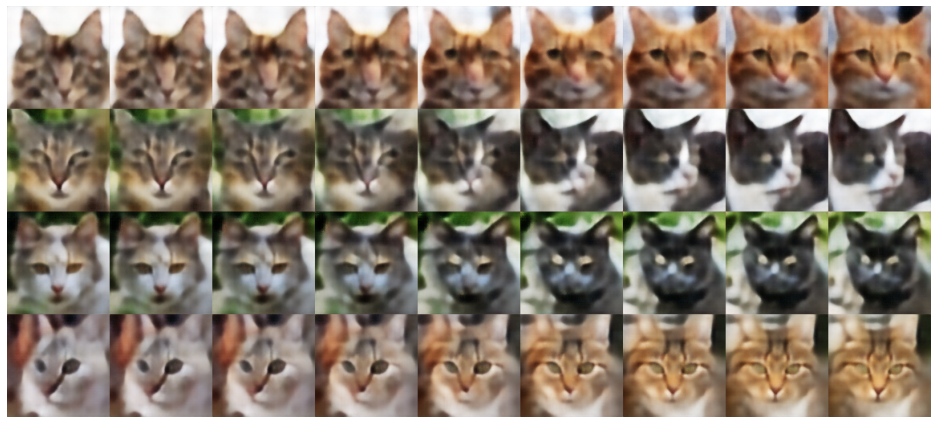

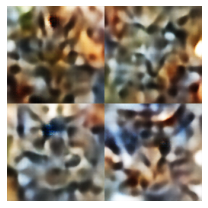

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 80 | Reconstruction loss: 1685.8165232024578 | KLD loss: 1193.7481486634438


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 81 | Reconstruction loss: 1685.8840393635057 | KLD loss: 1193.1480335685778


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 82 | Reconstruction loss: 1686.777219025985 | KLD loss: 1197.3722361689029


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 83 | Reconstruction loss: 1673.4897435348225 | KLD loss: 1194.8412096485588


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 84 | Reconstruction loss: 1667.4272090366908 | KLD loss: 1193.9910012950068


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 85 | Reconstruction loss: 1665.0772532587466 | KLD loss: 1196.261766516644


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 86 | Reconstruction loss: 1663.7830850352411 | KLD loss: 1191.5434818623228


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 87 | Reconstruction loss: 1659.9473949929943 | KLD loss: 1195.340368803984


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 88 | Reconstruction loss: 1662.5330955552758 | KLD loss: 1195.5288568342694


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 89 | Reconstruction loss: 1651.128557951554 | KLD loss: 1198.2838819041756


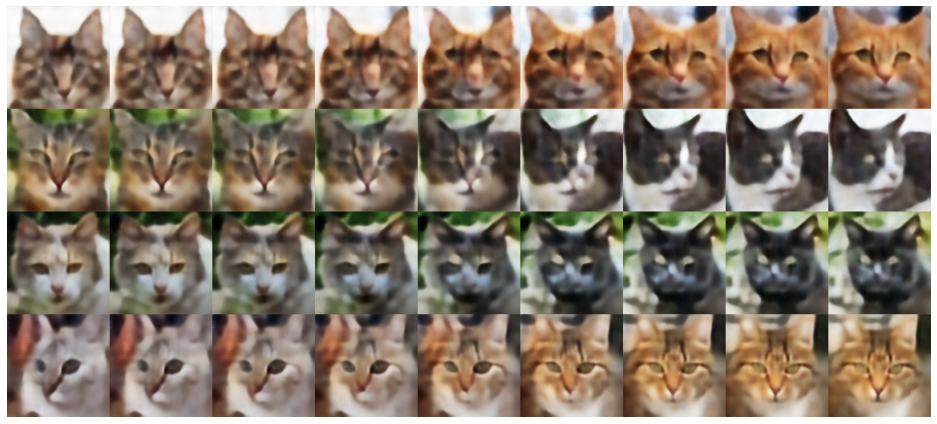

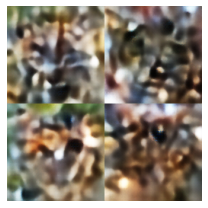

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 90 | Reconstruction loss: 1643.7917880419618 | KLD loss: 1193.6154247781506


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 91 | Reconstruction loss: 1645.7096112174277 | KLD loss: 1194.3778872282608


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 92 | Reconstruction loss: 1641.2514195412582 | KLD loss: 1197.7051935610564


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 93 | Reconstruction loss: 1632.0057554067291 | KLD loss: 1192.5200695724961


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 94 | Reconstruction loss: 1642.4411071398245 | KLD loss: 1194.8956823882108


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 95 | Reconstruction loss: 1636.255821275415 | KLD loss: 1196.9451629449122


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 96 | Reconstruction loss: 1630.0639488267602 | KLD loss: 1197.3961352235783


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 97 | Reconstruction loss: 1624.7542522738438 | KLD loss: 1194.8786643839771


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 98 | Reconstruction loss: 1619.034805582177 | KLD loss: 1192.9670599706424


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 99 | Reconstruction loss: 1615.8201001090292 | KLD loss: 1195.765783558721


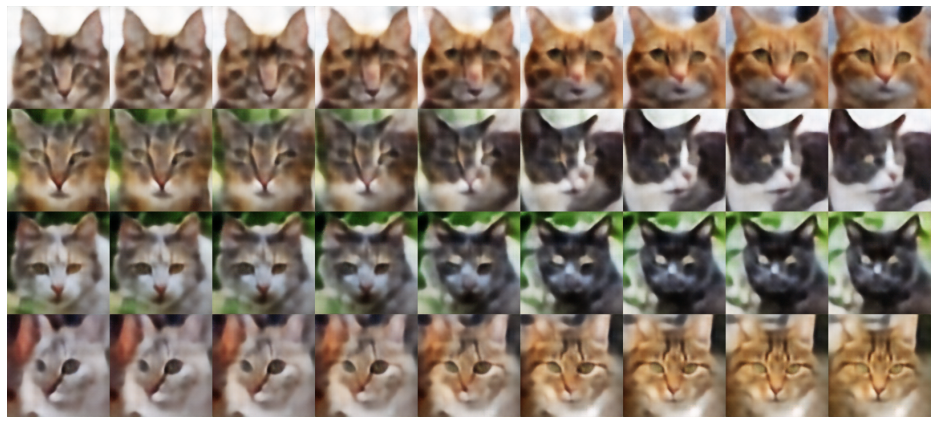

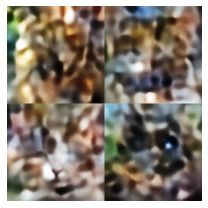

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 100 | Reconstruction loss: 1616.0342195878118 | KLD loss: 1196.3177389772782


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 101 | Reconstruction loss: 1608.0488438576645 | KLD loss: 1190.8361405082371


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 102 | Reconstruction loss: 1618.8950047463363 | KLD loss: 1198.2380943535277


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 103 | Reconstruction loss: 1604.3658229282923 | KLD loss: 1198.0686531777708


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 104 | Reconstruction loss: 1601.0117625360904 | KLD loss: 1194.5069762046294


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 105 | Reconstruction loss: 1601.1896904418188 | KLD loss: 1194.4464115119129


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 106 | Reconstruction loss: 1599.8992147504914 | KLD loss: 1196.4377401600714


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 107 | Reconstruction loss: 1592.1487087463 | KLD loss: 1196.3856708218593


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 108 | Reconstruction loss: 1594.124711409859 | KLD loss: 1195.6851946907755


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 109 | Reconstruction loss: 1589.3117700422772 | KLD loss: 1197.3543191281906


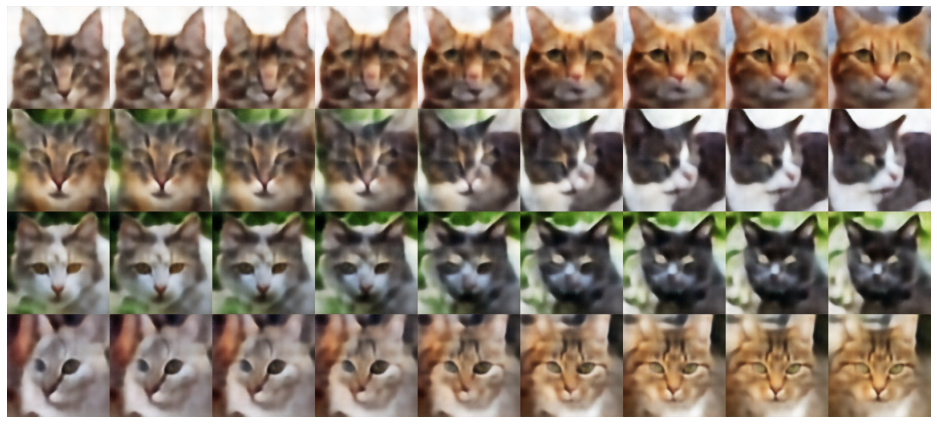

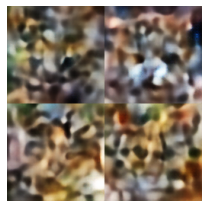

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 110 | Reconstruction loss: 1587.1475960867745 | KLD loss: 1197.0487464288747


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 111 | Reconstruction loss: 1586.9797161410313 | KLD loss: 1195.3540876874272


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 112 | Reconstruction loss: 1580.423130390807 | KLD loss: 1196.624550955636


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 113 | Reconstruction loss: 1576.0106139568068 | KLD loss: 1195.309835114094


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 114 | Reconstruction loss: 1577.3519122200723 | KLD loss: 1197.6932170228188


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 115 | Reconstruction loss: 1568.448903148959 | KLD loss: 1193.9098141119348


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 116 | Reconstruction loss: 1574.4621784849937 | KLD loss: 1198.2983830611897


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 117 | Reconstruction loss: 1571.3560120955758 | KLD loss: 1197.7475364163795


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 118 | Reconstruction loss: 1571.6402749008273 | KLD loss: 1196.6110864485272


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 119 | Reconstruction loss: 1572.1425013571793 | KLD loss: 1199.1805124223602


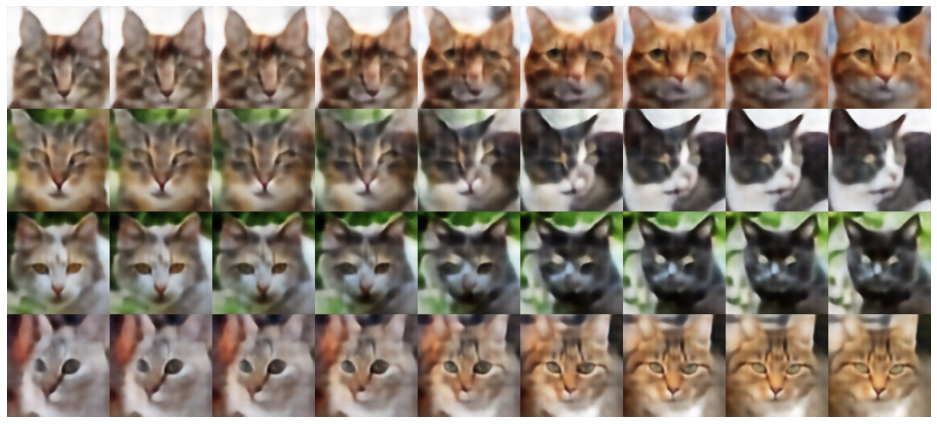

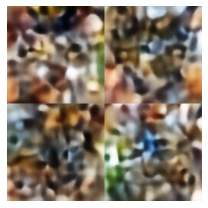

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 120 | Reconstruction loss: 1560.639872864907 | KLD loss: 1197.2105430460865


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 121 | Reconstruction loss: 1559.8295581888708 | KLD loss: 1197.5953041218822


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 122 | Reconstruction loss: 1556.1837817837734 | KLD loss: 1198.4828811550733


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 123 | Reconstruction loss: 1555.6469234679796 | KLD loss: 1199.0451540739639


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 124 | Reconstruction loss: 1552.7404272423028 | KLD loss: 1196.627412025973


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 125 | Reconstruction loss: 1552.2540063324923 | KLD loss: 1196.736275998702


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 126 | Reconstruction loss: 1552.92300898392 | KLD loss: 1197.9095163286102


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 127 | Reconstruction loss: 1550.5392429517663 | KLD loss: 1198.7314405737457


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 128 | Reconstruction loss: 1545.494849163553 | KLD loss: 1197.3456604762107


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 129 | Reconstruction loss: 1544.008340965887 | KLD loss: 1196.8773691876333


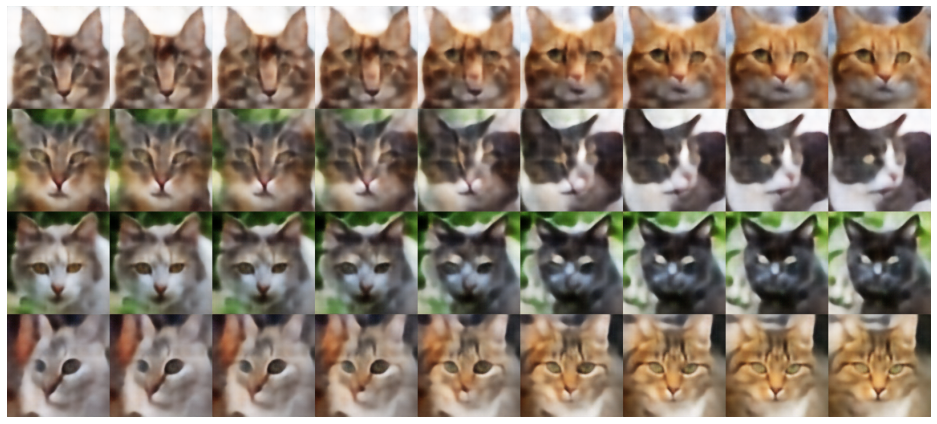

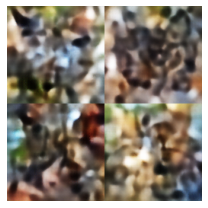

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 130 | Reconstruction loss: 1542.8545860148365 | KLD loss: 1197.7994858641061


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 131 | Reconstruction loss: 1540.4061530450856 | KLD loss: 1198.2092343916804


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 132 | Reconstruction loss: 1538.3217549768294 | KLD loss: 1200.0259098029285


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 133 | Reconstruction loss: 1533.4670975963522 | KLD loss: 1197.0680331591493


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 134 | Reconstruction loss: 1534.8812922128238 | KLD loss: 1196.7844225012739


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 135 | Reconstruction loss: 1535.389905562312 | KLD loss: 1199.7882777622767


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 136 | Reconstruction loss: 1528.8879262793878 | KLD loss: 1198.111591978843


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 137 | Reconstruction loss: 1526.591281488075 | KLD loss: 1198.2181659959117


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 138 | Reconstruction loss: 1523.278800063992 | KLD loss: 1196.0388917152925


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 139 | Reconstruction loss: 1528.639184134347 | KLD loss: 1197.6191827051389


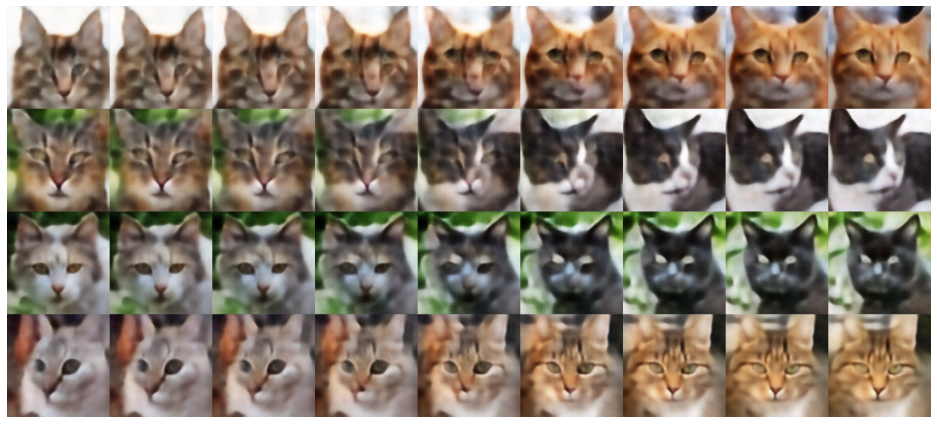

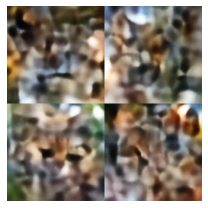

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 140 | Reconstruction loss: 1523.3286460734303 | KLD loss: 1198.3970598493304


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 141 | Reconstruction loss: 1522.5301999868072 | KLD loss: 1199.7093073684978


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 142 | Reconstruction loss: 1516.2179174008577 | KLD loss: 1197.2472452673112


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 143 | Reconstruction loss: 1522.0944544632243 | KLD loss: 1201.2683522479135


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 144 | Reconstruction loss: 1515.9497075051254 | KLD loss: 1197.1126263541464


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 145 | Reconstruction loss: 1510.3344458349002 | KLD loss: 1198.0105145377402


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 146 | Reconstruction loss: 1510.6378424034356 | KLD loss: 1197.64657137853


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 147 | Reconstruction loss: 1504.352855800842 | KLD loss: 1198.284878369444


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 148 | Reconstruction loss: 1512.6583479413334 | KLD loss: 1199.4510661060026


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 149 | Reconstruction loss: 1512.2925149668818 | KLD loss: 1200.4616987335016


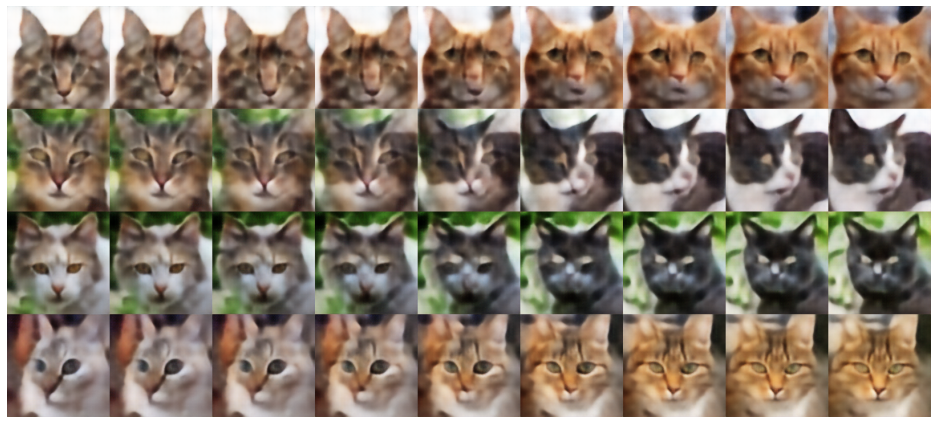

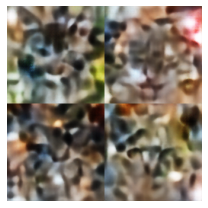

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 150 | Reconstruction loss: 1503.3474799683374 | KLD loss: 1201.1018763950892


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 151 | Reconstruction loss: 1505.2553458835769 | KLD loss: 1199.7667899753737


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 152 | Reconstruction loss: 1497.1336527759245 | KLD loss: 1197.6454805172748


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 153 | Reconstruction loss: 1498.7430754477934 | KLD loss: 1198.664238213012


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 154 | Reconstruction loss: 1502.6937685190521 | KLD loss: 1198.2246923979765


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 155 | Reconstruction loss: 1498.122147554196 | KLD loss: 1201.271465799083


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 156 | Reconstruction loss: 1493.5872925941987 | KLD loss: 1199.0239210424957


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 157 | Reconstruction loss: 1490.624488972729 | KLD loss: 1198.0809100607166


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 158 | Reconstruction loss: 1488.848868328592 | KLD loss: 1198.7729723438713


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 159 | Reconstruction loss: 1491.5463180068116 | KLD loss: 1198.6380746023995


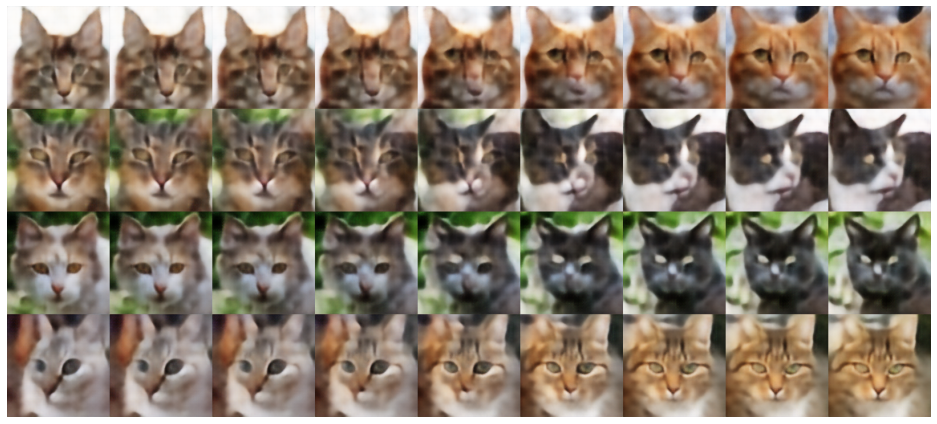

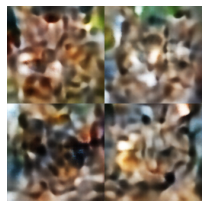

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 160 | Reconstruction loss: 1489.8402234189998 | KLD loss: 1200.6563392781322


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 161 | Reconstruction loss: 1490.699921791598 | KLD loss: 1199.6506776039644


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 162 | Reconstruction loss: 1483.1227623601878 | KLD loss: 1199.7007734405329


  0%|          | 0/645 [00:00<?, ?it/s]

In [ ]:
train_vae()